In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch

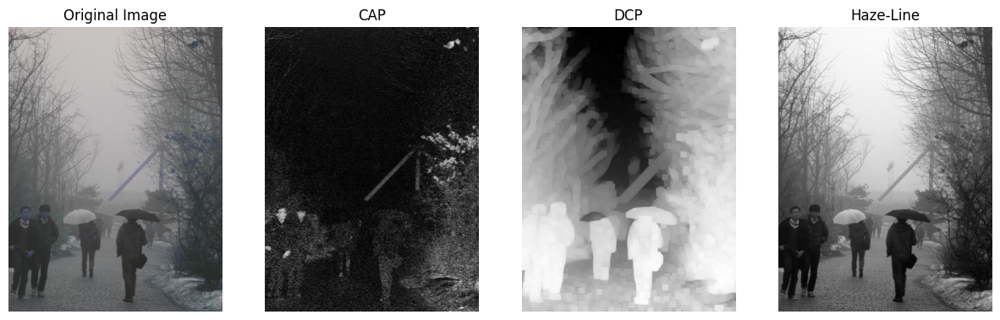

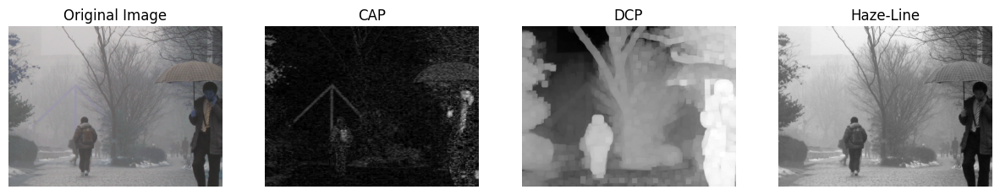

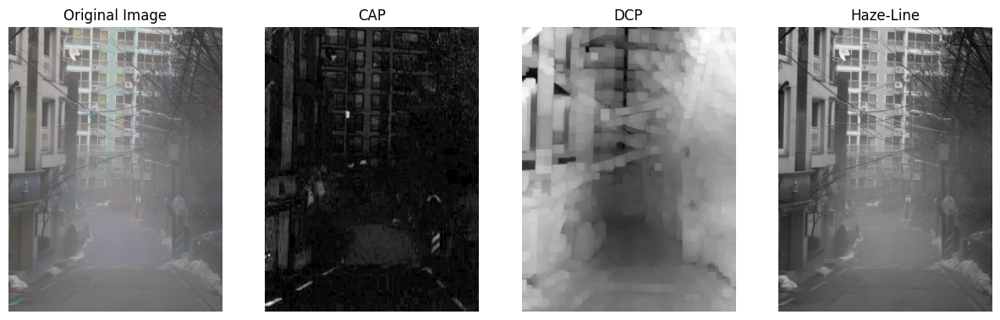

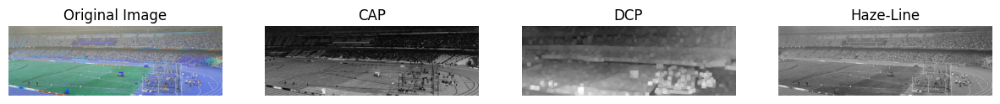

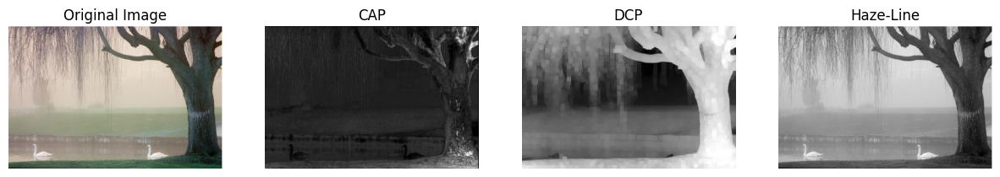

In [2]:


def compute_cap_transmission(image, omega=0.95):
    """Color Attenuation Prior (CAP)"""
    image = image.astype(np.float32) / 255.0
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    brightness = hsv[:, :, 2]
    saturation = hsv[:, :, 1]
    beta = np.max(brightness) + 1e-5
    transmission = 1 - omega * (beta - saturation)
    return np.clip(transmission, 0, 1)

def compute_dcp_transmission(image, omega=0.95, patch_size=15):
    """Dark Channel Prior (DCP)"""
    image = image.astype(np.float32) / 255.0
    min_channel = np.min(image, axis=2)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (patch_size, patch_size))
    dark_channel = cv2.erode(min_channel, kernel)
    transmission = 1 - omega * dark_channel
    return np.clip(transmission, 0, 1)

def compute_haze_line_transmission(image, omega=0.95):
    """Haze-Line Prior"""
    image = image.astype(np.float32) / 255.0
    mean_intensity = np.mean(image, axis=2)
    beta = np.max(mean_intensity) + 1e-5
    transmission = 1 - omega * (beta - mean_intensity)
    return np.clip(transmission, 0, 1)

def compute_all_priors(image):
    """Computes selected priors and returns as a tensor."""
    priors = {
        "Original Image": image / 255.0,
        "CAP": compute_cap_transmission(image),
        "DCP": compute_dcp_transmission(image),
        "Haze-Line": compute_haze_line_transmission(image),
    }
    return priors

def visualize_priors(image):
    """Compute priors and display them side by side."""
    priors = compute_all_priors(image)
    fig, axes = plt.subplots(1, len(priors), figsize=(15, 5))
    
    for ax, (title, prior) in zip(axes, priors.items()):
        ax.imshow(prior, cmap="gray" if title != "Original Image" else None)
        ax.set_title(title, fontsize=12)
        ax.axis("off")
    
    plt.show()



image_path = "dataset/base/train/St_Wf_D_L__033.JPG"
image = cv2.imread(image_path)
visualize_priors(image)
image_path = "dataset/base/train/St_Wf_D_L__029.JPG"
image = cv2.imread(image_path)
visualize_priors(image)
image_path = "dataset/base/train/St_Wf_D_L__009.JPG"
image = cv2.imread(image_path)
visualize_priors(image)
image_path = "dataset/base/test/91.jpg"
image = cv2.imread(image_path)
visualize_priors(image)
image_path = "dataset/base/test/92.jpg"
image = cv2.imread(image_path)
visualize_priors(image)

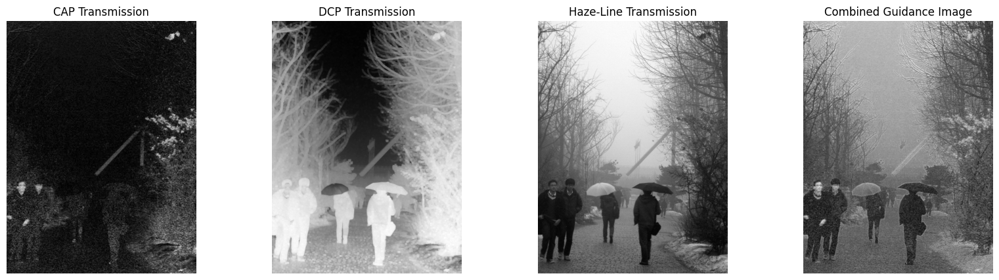

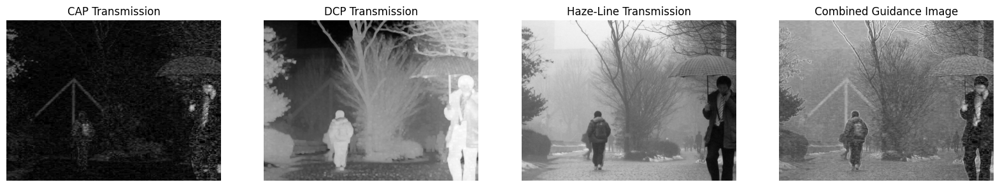

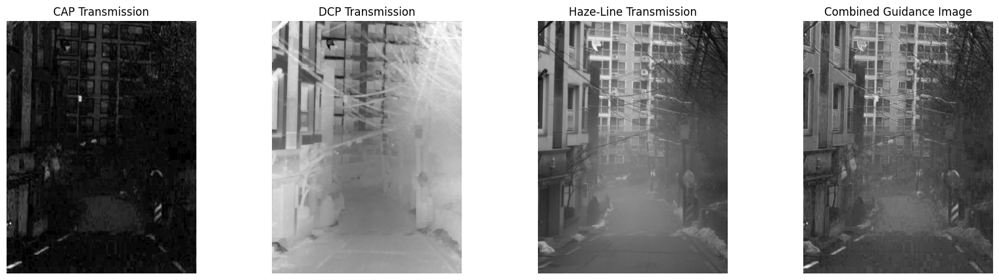

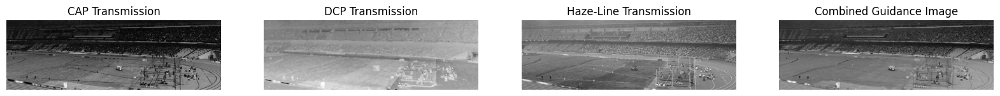

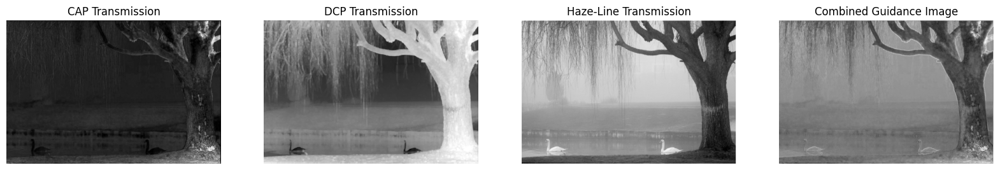

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


# Function to compute Color Attenuation Prior (CAP) transmission map
def compute_cap_transmission(image, omega=0.95):
    image = image.astype(np.float32) / 255.0
    hsv = cv2.cvtColor((image * 255).astype(np.uint8), cv2.COLOR_RGB2HSV)
    brightness = hsv[:, :, 2] / 255.0
    saturation = hsv[:, :, 1] / 255.0
    beta = np.max(brightness) + 1e-5
    transmission = 1 - omega * (beta - saturation)
    return np.clip(transmission, 0, 1)

# Function to compute Dark Channel Prior (DCP) transmission map
def compute_dcp_transmission(image, omega=0.4, patch_size=5):
    image = image.astype(np.float32) / 255.0
    min_channel = np.min(image, axis=2)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (patch_size, patch_size))
    dark_channel = cv2.erode(min_channel, kernel)
    transmission = 1 - omega * dark_channel
    return np.clip(transmission, 0, 1)

# Function to compute Haze-Line Prior transmission map
def compute_haze_line_transmission(image, omega=0.95):
    image = image.astype(np.float32) / 255.0
    mean_intensity = np.mean(image, axis=2)
    beta = np.max(mean_intensity) + 1e-5
    transmission = 1 - omega * (beta - mean_intensity)
    return np.clip(transmission, 0, 1)

# Load the image

image_paths = ["dataset/base/train/St_Wf_D_L__033.JPG"
    , "dataset/base/train/St_Wf_D_L__029.JPG"
    , "dataset/base/train/St_Wf_D_L__009.JPG"
    , "dataset/base/test/91.jpg"
    , "dataset/base/test/92.jpg"]
for image_path in image_paths:
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB

    # Compute transmission maps
    cap_transmission = compute_cap_transmission(image)
    dcp_transmission = compute_dcp_transmission(image)
    haze_line_transmission = compute_haze_line_transmission(image)

    # Combine the guidance maps (taking average for balanced contribution)
    combined_guidance = (cap_transmission + dcp_transmission + haze_line_transmission) / 3

    # Display the results
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    axes[0].imshow(cap_transmission, cmap='gray')
    axes[0].set_title("CAP Transmission")
    axes[0].axis("off")

    axes[1].imshow(dcp_transmission, cmap='gray')
    axes[1].set_title("DCP Transmission")
    axes[1].axis("off")

    axes[2].imshow(haze_line_transmission, cmap='gray')
    axes[2].set_title("Haze-Line Transmission")
    axes[2].axis("off")

    axes[3].imshow(combined_guidance, cmap='gray')
    axes[3].set_title("Combined Guidance Image")
    axes[3].axis("off")

    plt.show()


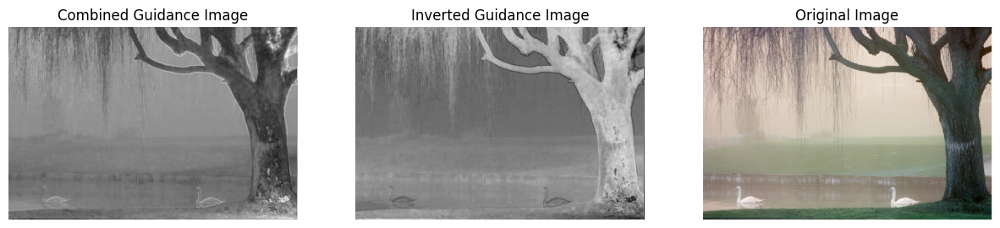

In [4]:
# Invert the combined guidance image
inverted_guidance = 1 - combined_guidance

# Display the inverted guidance image
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(combined_guidance, cmap='gray')
plt.title('Combined Guidance Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(inverted_guidance, cmap='gray')
plt.title('Inverted Guidance Image')
plt.axis('off')

# Display original image on the right side
plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.show()

In [25]:
import os
import cv2
import numpy as np
import time
import matplotlib.pyplot as plt

def compute_cap_transmission(image, omega=0.95):
    image = image.astype(np.float32) / 255.0
    hsv = cv2.cvtColor((image * 255).astype(np.uint8), cv2.COLOR_RGB2HSV)
    brightness = hsv[:, :, 2] / 255.0
    saturation = hsv[:, :, 1] / 255.0
    beta = np.max(brightness) + 1e-5
    transmission = 1 - omega * (beta - saturation)
    return np.clip(transmission, 0, 1)

def compute_dcp_transmission(image, omega=0.95, patch_size=15):
    image = image.astype(np.float32) / 255.0
    min_channel = np.min(image, axis=2)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (patch_size, patch_size))
    dark_channel = cv2.erode(min_channel, kernel)
    transmission = 1 - omega * dark_channel
    return np.clip(transmission, 0, 1)

def compute_haze_line_transmission(image, omega=0.95):
    image = image.astype(np.float32) / 255.0
    mean_intensity = np.mean(image, axis=2)
    beta = np.max(mean_intensity) + 1e-5
    transmission = 1 - omega * (beta - mean_intensity)
    return np.clip(transmission, 0, 1)

def create_guidance_image(image, omega=0.95, patch_size=15):
    cap_transmission = compute_cap_transmission(image, omega)
    dcp_transmission = compute_dcp_transmission(image, omega, patch_size)
    haze_line_transmission = compute_haze_line_transmission(image, omega)
    guidance_image = (cap_transmission + dcp_transmission + haze_line_transmission) / 3.0
    return guidance_image

In [ ]:


def process_and_save_images(input_dir, output_dir):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    for filename in os.listdir(input_dir):
        if filename.endswith(".JPG") or filename.endswith(".jpg"):
            image_path = os.path.join(input_dir, filename)
            image = cv2.imread(image_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            
            guidance_image = create_guidance_image(image)
            
            output_path = os.path.join(output_dir, filename)
            cv2.imwrite(output_path, (guidance_image * 255).astype(np.uint8))
            print(f"Processed and saved: {output_path}")

# Process train and test datasets
process_and_save_images("dataset/base/train", "dataset/guided/train")
process_and_save_images("dataset/base/test", "dataset/guided/test")


Processed and saved: dataset/guided/train/1.jpg
Processed and saved: dataset/guided/train/10.jpg
Processed and saved: dataset/guided/train/100.jpg
Processed and saved: dataset/guided/train/10003688883_be11839091_z.jpg
Processed and saved: dataset/guided/train/10020320283_83b1514ef4_z.jpg
Processed and saved: dataset/guided/train/100309892_94978cd79e_z.jpg
Processed and saved: dataset/guided/train/100412171_55555c1ce0_z.jpg
Processed and saved: dataset/guided/train/101.jpg
Processed and saved: dataset/guided/train/101039_5ab416185b_z.jpg
Processed and saved: dataset/guided/train/102.jpg
Processed and saved: dataset/guided/train/10278173383_990d01a5eb_z.jpg
Processed and saved: dataset/guided/train/10367996104_44d1937338_z.jpg
Processed and saved: dataset/guided/train/1055104210_c386d6111c_z.jpg
Processed and saved: dataset/guided/train/10560349313_689e068235_z.jpg
Processed and saved: dataset/guided/train/10677419946_15c3d79e45_z.jpg
Processed and saved: dataset/guided/train/10750317316

In [6]:
def compute_adaptive_dcp_transmission(image, omega=0.95, base_patch_size=15):
    """Adaptive Dark Channel Prior (ADCP)"""
    image = image.astype(np.float32) / 255.0
    min_channel = np.min(image, axis=2)

    # Adaptive patch size: increase where haze is dense (low intensity regions)
    haze_density = 1 - min_channel  # Estimate haze density
    adaptive_patch_size = np.clip((haze_density * base_patch_size * 2).astype(int), 3, 35)

    transmission = np.ones_like(min_channel)
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            patch_size = adaptive_patch_size[i, j]
            half_size = patch_size // 2
            i_min, i_max = max(0, i - half_size), min(image.shape[0], i + half_size)
            j_min, j_max = max(0, j - half_size), min(image.shape[1], j + half_size)
            dark_channel = np.min(min_channel[i_min:i_max, j_min:j_max])
            transmission[i, j] = 1 - omega * dark_channel

    return np.clip(transmission, 0, 1)

def compute_bright_channel_prior(image, omega=0.95):
    """Bright Channel Prior (BCP) - Useful for bright, dense haze areas."""
    image = image.astype(np.float32) / 255.0
    max_channel = np.max(image, axis=2)
    transmission = 1 - omega * max_channel  # Reverse of dark channel
    return np.clip(transmission, 0, 1)

# Compute improved transmission maps
cap_transmission_list = []
adaptive_dcp_transmission_list = []
bright_channel_transmission_list = []

image_paths = ["dataset/base/train/St_Wf_D_L__033.JPG"]
# "dataset/base/train/St_Wf_D_L__029.JPG", "dataset/base/train/St_Wf_D_L__009.JPG", "dataset/base/test/91.jpg", "dataset/base/test/92.jpg"

for img_path in image_paths:
    img = cv2.imread(img_path)
    cap_transmission_list.append(compute_cap_transmission(img))
    adaptive_dcp_transmission_list.append(compute_adaptive_dcp_transmission(img))
    bright_channel_transmission_list.append(compute_bright_channel_prior(img))

# Example usage for the first image
for i in range(len(image_paths)):
    cap_transmission =  cap_transmission_list[i]
    adaptive_dcp_transmission = adaptive_dcp_transmission_list[i]
    bright_channel_transmission = bright_channel_transmission_list[i]

    # Multi-scale fusion: Combining different priors
    enhanced_guidance = (cap_transmission + adaptive_dcp_transmission + haze_line_transmission + bright_channel_transmission) / 4

    # Display the results
    fig, axes = plt.subplots(1, 5, figsize=(25, 5))
    axes[0].imshow(adaptive_dcp_transmission, cmap='gray')
    axes[0].set_title("Adaptive DCP Transmission")
    axes[0].axis("off")

    axes[1].imshow(bright_channel_transmission, cmap='gray')
    axes[1].set_title("Bright Channel Prior Transmission")
    axes[1].axis("off")

    axes[2].imshow(combined_guidance, cmap='gray')
    axes[2].set_title("Previous Combined Guidance")
    axes[2].axis("off")

    axes[3].imshow(enhanced_guidance, cmap='gray')
    axes[3].set_title("Enhanced Guidance Image")
    axes[3].axis("off")

    axes[4].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[4].set_title("Original Image")
    axes[4].axis("off")

    plt.show()


ValueError: operands could not be broadcast together with shapes (800,600) (557,835) 

(800, 600, 3)
(800, 600)


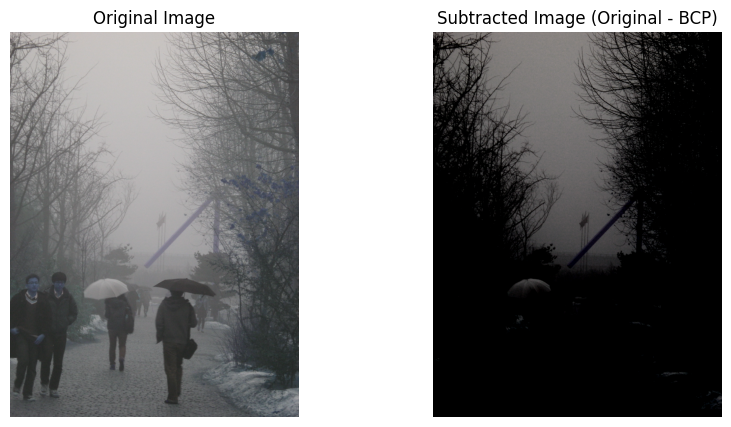

(480, 640, 3)
(480, 640)


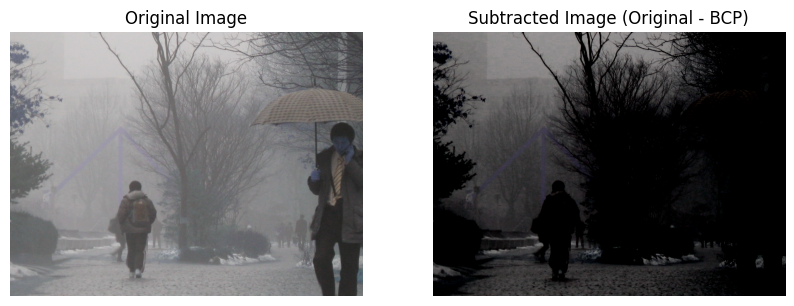

(640, 480, 3)
(640, 480)


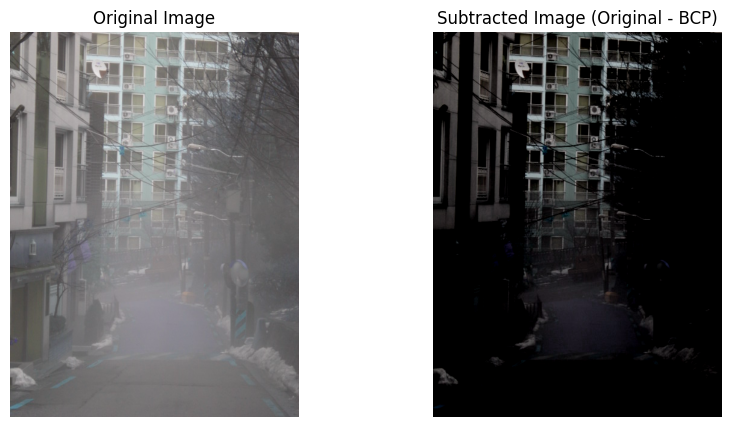

(327, 1000, 3)
(327, 1000)


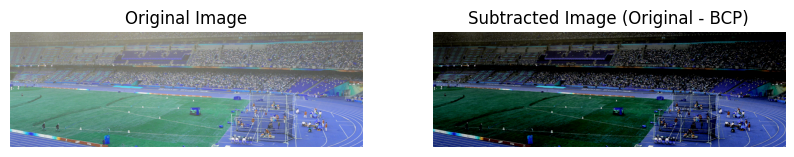

(557, 835, 3)
(557, 835)


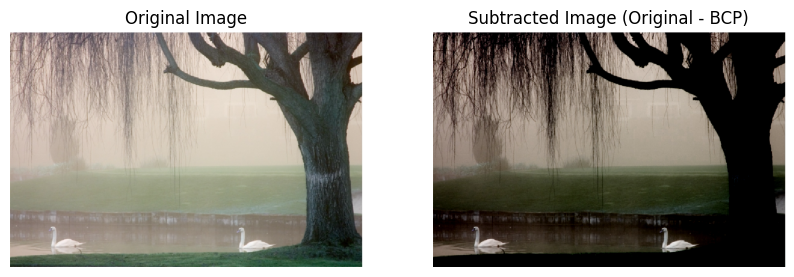

In [17]:
image_paths = ["dataset/base/train/St_Wf_D_L__033.JPG"
    , "dataset/base/train/St_Wf_D_L__029.JPG"
    , "dataset/base/train/St_Wf_D_L__009.JPG"
    , "dataset/base/test/91.jpg"
    , "dataset/base/test/92.jpg"]
bright_channel_transmission_list = []
for image_path in image_paths:
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB
    bright_channel_transmission = compute_bright_channel_prior(image)
    print(image.shape)
    print(bright_channel_transmission.shape)

    # Subtract bright channel prior from the original image
    subtracted_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0 - bright_channel_transmission[:, :, np.newaxis]

    # Clip the values to be in the valid range [0, 1]
    subtracted_image = np.clip(subtracted_image, 0, 1)

    # Display the subtracted image
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(subtracted_image)
    plt.title('Subtracted Image (Original - BCP)')
    plt.axis('off')

    plt.show()

In [ ]:
import cv2
import numpy as np

def dark_channel_prior(image, size=15):
    min_channel = np.amin(image, axis=2)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (size, size))
    dark_channel = cv2.erode(min_channel, kernel)
    return dark_channel

def atmospheric_light_(image, dark_channel):
    flat_image = image.reshape(-1, 3)
    flat_dark = dark_channel.ravel()
    search_idx = (-flat_dark).argsort()[:int(0.001 * len(flat_dark))]
    return np.mean(flat_image[search_idx], axis=0)

def transmission_estimate(image, atmospheric_light, size=15, omega=0.95):
    norm_image = image / atmospheric_light
    transmission = 1 - omega * dark_channel_prior(norm_image, size)
    return transmission

def guided_filter(image, p, radius=60, eps=1e-3):
    mean_I = cv2.boxFilter(image, cv2.CV_64F, (radius, radius))
    mean_p = cv2.boxFilter(p, cv2.CV_64F, (radius, radius))
    mean_Ip = cv2.boxFilter(image * p, cv2.CV_64F, (radius, radius))
    cov_Ip = mean_Ip - mean_I * mean_p

    mean_II = cv2.boxFilter(image * image, cv2.CV_64F, (radius, radius))
    var_I = mean_II - mean_I * mean_I

    a = cov_Ip / (var_I + eps)
    b = mean_p - a * mean_I

    mean_a = cv2.boxFilter(a, cv2.CV_64F, (radius, radius))
    mean_b = cv2.boxFilter(b, cv2.CV_64F, (radius, radius))

    q = mean_a * image + mean_b
    return q

def recover(image, transmission, atmospheric_light, t0=0.1):
    transmission = np.maximum(transmission, t0)
    J = (image - atmospheric_light) / transmission + atmospheric_light
    return J

def dehaze(image_path):
    image = cv2.imread(image_path).astype(np.float64) / 255
    dark_channel = dark_channel_prior(image)
    atmospheric_light = atmospheric_light_(image, dark_channel)
    transmission = transmission_estimate(image, atmospheric_light)
    transmission = guided_filter(cv2.cvtColor(image, cv2.COLOR_BGR2GRAY), transmission)
    result = recover(image, transmission, atmospheric_light)
    return (result * 255).astype(np.uint8)

# Example usage
image_paths = ["dataset/base/train/St_Wf_D_L__033.JPG"
    , "dataset/base/train/St_Wf_D_L__029.JPG"
    , "dataset/base/train/St_Wf_D_L__009.JPG"
    , "dataset/base/test/91.jpg"
    , "dataset/base/test/92.jpg"]
for image_path in image_paths:
    dehazed_image = dehaze(image_path)
    plt.imshow(cv2.cvtColor(dehazed_image, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.show()



error: OpenCV(4.10.0) /Users/xperience/GHA-Actions-OpenCV/_work/opencv-python/opencv-python/opencv/modules/imgproc/src/color.simd_helpers.hpp:94: error: (-2:Unspecified error) in function 'cv::impl::(anonymous namespace)::CvtHelper<cv::impl::(anonymous namespace)::Set<3, 4, -1>, cv::impl::(anonymous namespace)::Set<1, -1, -1>, cv::impl::(anonymous namespace)::Set<0, 2, 5>, cv::impl::(anonymous namespace)::NONE>::CvtHelper(cv::InputArray, cv::OutputArray, int) [VScn = cv::impl::(anonymous namespace)::Set<3, 4, -1>, VDcn = cv::impl::(anonymous namespace)::Set<1, -1, -1>, VDepth = cv::impl::(anonymous namespace)::Set<0, 2, 5>, sizePolicy = cv::impl::(anonymous namespace)::NONE]'
> Unsupported depth of input image:
>     'VDepth::contains(depth)'
> where
>     'depth' is 6 (CV_64F)


In [8]:
import cv2
import numpy as np

def dark_channel(image, patch_size=15):
    """Compute the dark channel of an image."""
    min_channel = np.min(image, axis=2)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (patch_size, patch_size))
    dark = cv2.erode(min_channel, kernel)
    return dark

def estimate_atmospheric_light(image, dark, top_percent=0.1):
    """Estimate the atmospheric light from the dark channel."""
    num_pixels = dark.shape[0] * dark.shape[1]
    num_top_pixels = int(max(1, num_pixels * top_percent))
    flat_image = image.reshape(-1, 3)
    flat_dark = dark.ravel()
    indices = np.argpartition(flat_dark, -num_top_pixels)[-num_top_pixels:]
    atmospheric_light = np.max(flat_image[indices], axis=0)
    return atmospheric_light

def estimate_transmission(image, atmospheric_light, patch_size=15, omega=0.95):
    """Estimate the transmission map."""
    normalized_image = image / atmospheric_light
    dark = dark_channel(normalized_image, patch_size)
    transmission = 1 - omega * dark
    return transmission

def dehaze(image, patch_size=15, omega=0.95, t0=0.1):
    """Dehaze an image using the Dark Channel Prior."""
    # Convert image to float and normalize
    image = image.astype(np.float32) / 255.0

    # Compute dark channel
    dark = dark_channel(image, patch_size)

    # Estimate atmospheric light
    atmospheric_light = estimate_atmospheric_light(image, dark)

    # Estimate transmission map
    transmission = estimate_transmission(image, atmospheric_light, patch_size, omega)

    # Refine transmission map using guided filter (optional)
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    transmission = cv2.ximgproc.guidedFilter(gray_image, transmission, radius=40, eps=1e-3)

    # Ensure transmission is not too small
    transmission = np.clip(transmission, t0, 1.0)

    # Recover the scene radiance
    recovered_image = np.empty_like(image)
    for i in range(3):
        recovered_image[:, :, i] = (image[:, :, i] - atmospheric_light[i]) / transmission + atmospheric_light[i]

    # Clip and convert back to 8-bit
    recovered_image = np.clip(recovered_image, 0, 1)
    recovered_image = (recovered_image * 255).astype(np.uint8)

    return recovered_image, transmission

# Load a hazy image
image_paths = ["dataset/base/train/St_Wf_D_L__033.JPG"
    , "dataset/base/train/St_Wf_D_L__029.JPG"
    , "dataset/base/train/St_Wf_D_L__009.JPG"
    , "dataset/base/test/91.jpg"
    , "dataset/base/test/92.jpg"]
for image_path in image_paths:
    image = cv2.imread(image_path)

    # Dehaze the image
    dehazed_image, transmission = dehaze(image)

    # Display the results
    cv2.imshow('Original Hazy Image', image)
    cv2.imshow('Dehazed Image', dehazed_image)
    cv2.imshow('Transmission Map', (transmission * 255).astype(np.uint8))
    cv2.waitKey(0)
    cv2.destroyAllWindows()
# image = cv2.imread('hazy_image.jpg')

# # Dehaze the image
# dehazed_image, transmission = dehaze(image)

# # Save or display the results
# cv2.imwrite('dehazed_image.jpg', dehazed_image)
# cv2.imwrite('transmission_map.jpg', (transmission * 255).astype(np.uint8))

# # Display the results
# cv2.imshow('Original Hazy Image', image)
# cv2.imshow('Dehazed Image', dehazed_image)
# cv2.imshow('Transmission Map', transmission)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

AttributeError: module 'cv2' has no attribute 'ximgproc'

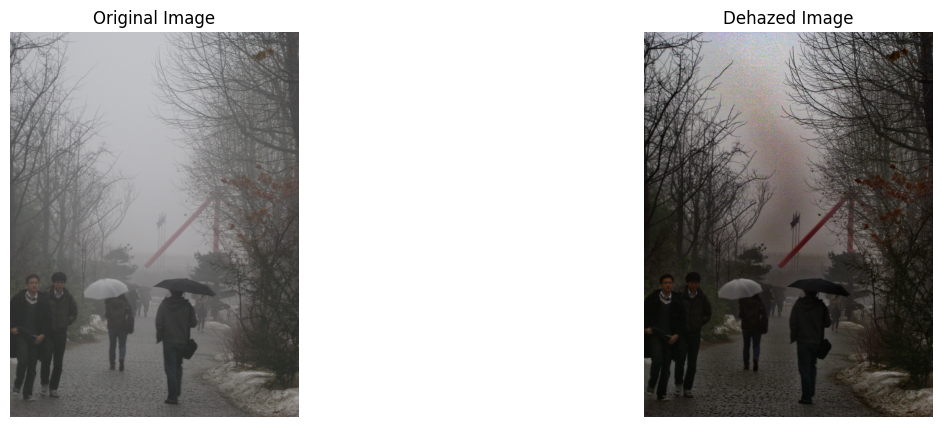

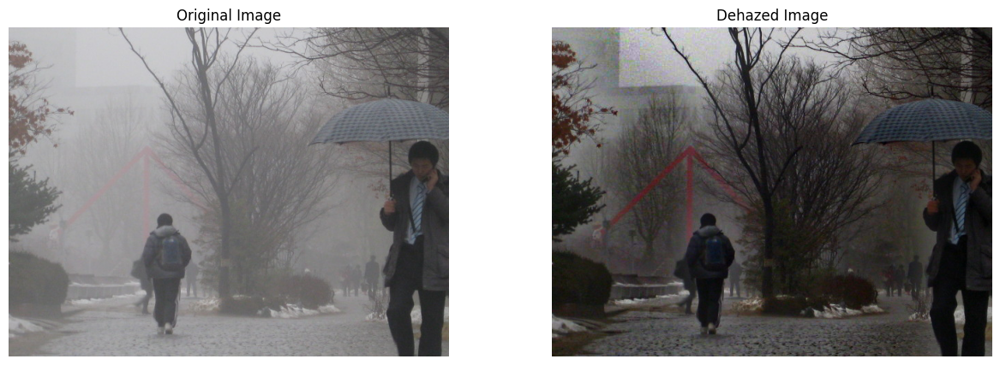

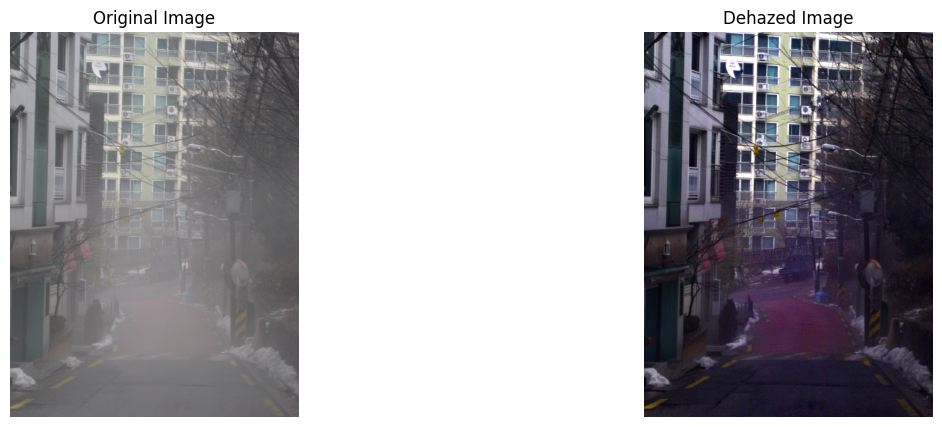

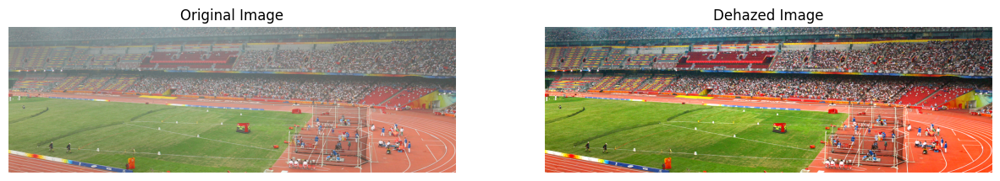

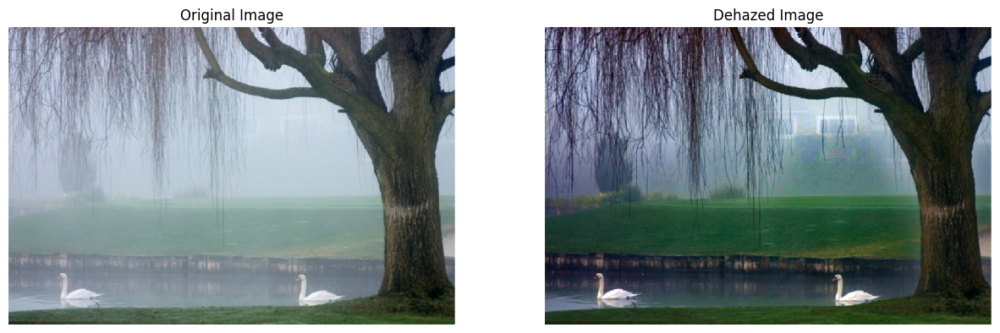

In [30]:
import cv2
import numpy as np

def dark_channel(img, size=15):
    """Computes the dark channel of an image."""
    min_channel = np.min(img, axis=2)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (size, size))
    dark = cv2.erode(min_channel, kernel)
    return dark

def atmospheric_light(img, dark):
    """Estimates the atmospheric light by finding the brightest pixels in the dark channel."""
    h, w = img.shape[:2]
    num_pixels = h * w // 1000  # Take top 0.1% brightest pixels
    dark_vec = dark.reshape(h * w)
    img_vec = img.reshape(h * w, 3)
    indices = np.argsort(dark_vec)[-num_pixels:]  # Get indices of top pixels
    atmo_light = np.mean(img_vec[indices], axis=0)  # Compute mean of brightest pixels
    return atmo_light

def transmission_estimate(img, atmo_light, omega=0.95, size=15):
    """Estimates the transmission map."""
    norm_img = img / atmo_light
    transmission = 1 - omega * dark_channel(norm_img, size)
    return transmission

def guided_filter(I, p, r, eps):
    """Guided filter for refining the transmission map."""
    mean_I = cv2.boxFilter(I, cv2.CV_64F, (r, r))
    mean_p = cv2.boxFilter(p, cv2.CV_64F, (r, r))
    corr_I = cv2.boxFilter(I * I, cv2.CV_64F, (r, r))
    corr_Ip = cv2.boxFilter(I * p, cv2.CV_64F, (r, r))

    var_I = corr_I - mean_I * mean_I
    cov_Ip = corr_Ip - mean_I * mean_p

    a = cov_Ip / (var_I + eps)
    b = mean_p - a * mean_I

    mean_a = cv2.boxFilter(a, cv2.CV_64F, (r, r))
    mean_b = cv2.boxFilter(b, cv2.CV_64F, (r, r))

    q = mean_a * I + mean_b
    return q

def recover_image(img, t, atmo_light, t0=0.1):
    """Recovers the haze-free image using the estimated transmission map."""
    t = np.maximum(t, t0)  # Avoid division by zero
    J = (img - atmo_light) / t[:, :, None] + atmo_light
    return np.clip(J, 0, 1)

def dehaze(img_path):
    """Complete dehazing pipeline using Dark Channel Prior."""
    img = cv2.imread(img_path) / 255.0  # Normalize image
    dark = dark_channel(img)
    atmo_light = atmospheric_light(img, dark)
    transmission = transmission_estimate(img, atmo_light)
    
    # Refining transmission map using guided filter
    gray_img = cv2.cvtColor((img * 255).astype(np.uint8), cv2.COLOR_BGR2GRAY) / 255.0
    refined_t = guided_filter(gray_img, transmission, r=60, eps=1e-3)
    
    dehazed_img = recover_image(img, refined_t, atmo_light)
    return (dehazed_img * 255).astype(np.uint8)

# Example usage:
image_paths = ["dataset/base/train/St_Wf_D_L__033.JPG"
    , "dataset/base/train/St_Wf_D_L__029.JPG"
    , "dataset/base/train/St_Wf_D_L__009.JPG"
    , "dataset/base/test/91.jpg"
    , "dataset/base/test/92.jpg"]
for image_path in image_paths:
    dehazed_img = dehaze(image_path)
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 2, 1)
    image = cv2.imread(image_path)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(dehazed_img, cv2.COLOR_BGR2RGB))
    plt.title('Dehazed Image')
    plt.axis('off')

    plt.show()


In [31]:
# dehaze image in dataset/base/train/ and dataset/base/test/ and store in dataset/dehazed/train/ and dataset/dehazed/test/
import os
import cv2
import numpy as np
import time
import matplotlib.pyplot as plt

def dehaze_image(input_dir, output_dir):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    for filename in os.listdir(input_dir):
        if filename.endswith(".JPG") or filename.endswith(".jpg"):
            image_path = os.path.join(input_dir, filename)
            dehazed_image = dehaze(image_path)
            output_path = os.path.join(output_dir, filename)
            cv2.imwrite(output_path, dehazed_image)
            print(f"Processed and saved: {output_path}")

# Process train and test datasets
dehaze_image("dataset/base/train", "dataset/dehazed/train")
dehaze_image("dataset/base/test", "dataset/dehazed/test")


Processed and saved: dataset/dehazed/train/1.jpg
Processed and saved: dataset/dehazed/train/10.jpg
Processed and saved: dataset/dehazed/train/100.jpg
Processed and saved: dataset/dehazed/train/10003688883_be11839091_z.jpg
Processed and saved: dataset/dehazed/train/10020320283_83b1514ef4_z.jpg
Processed and saved: dataset/dehazed/train/100309892_94978cd79e_z.jpg
Processed and saved: dataset/dehazed/train/100412171_55555c1ce0_z.jpg
Processed and saved: dataset/dehazed/train/101.jpg
Processed and saved: dataset/dehazed/train/101039_5ab416185b_z.jpg
Processed and saved: dataset/dehazed/train/102.jpg
Processed and saved: dataset/dehazed/train/10278173383_990d01a5eb_z.jpg
Processed and saved: dataset/dehazed/train/10367996104_44d1937338_z.jpg
Processed and saved: dataset/dehazed/train/1055104210_c386d6111c_z.jpg
Processed and saved: dataset/dehazed/train/10560349313_689e068235_z.jpg
Processed and saved: dataset/dehazed/train/10677419946_15c3d79e45_z.jpg
Processed and saved: dataset/dehazed/t

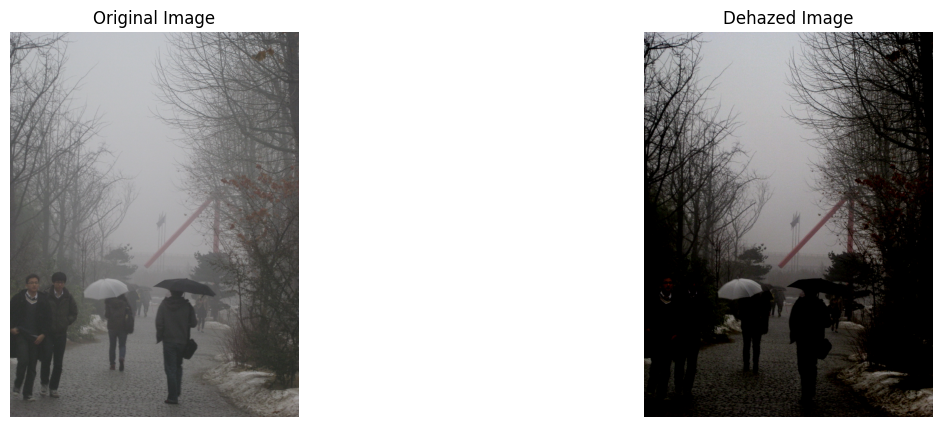

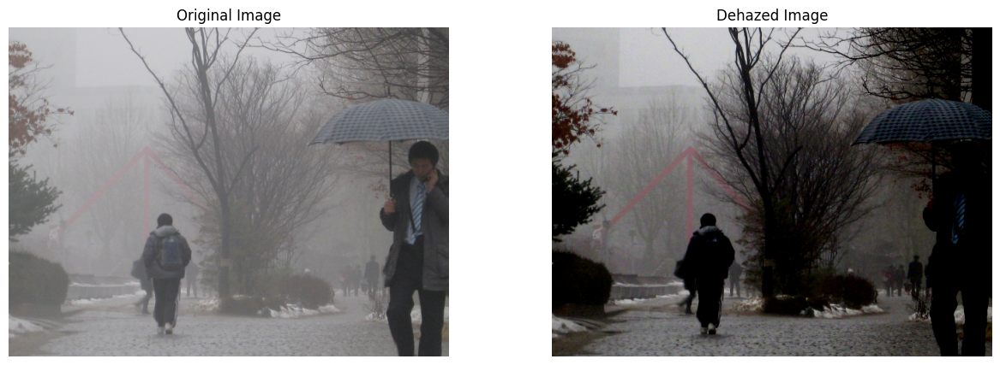

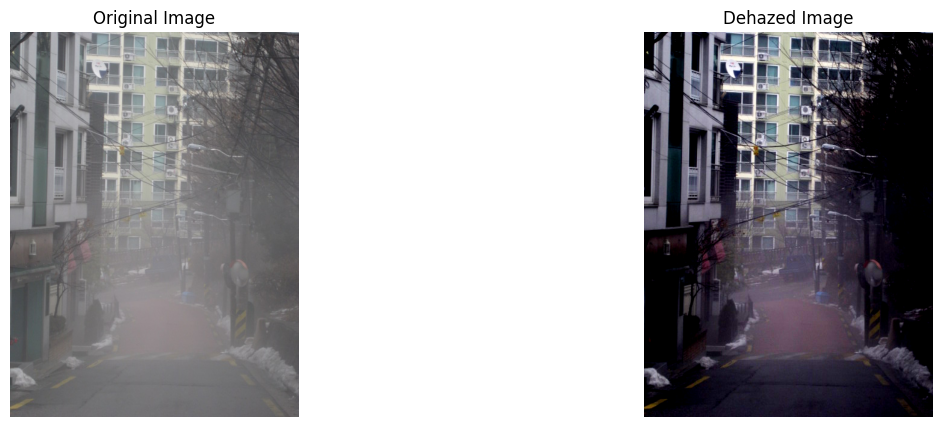

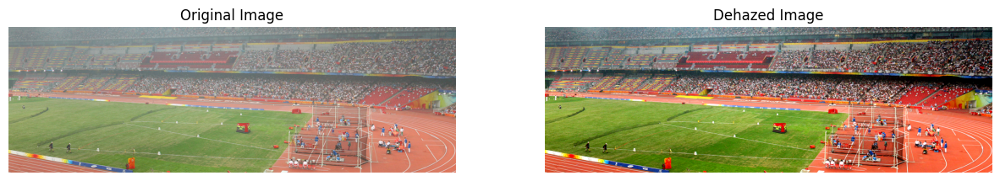

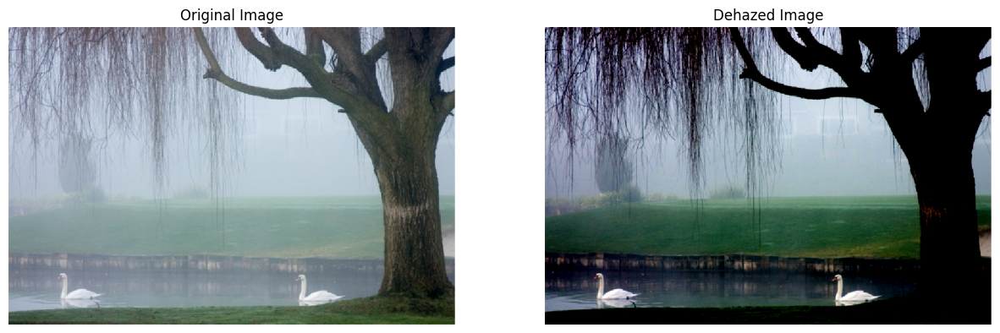

In [29]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

def dark_channel(img, size=15):
    """Computes the dark channel of an image."""
    min_channel = np.min(img, axis=2)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (size, size))
    dark = cv2.erode(min_channel, kernel)
    return dark

def atmospheric_light(img, dark):
    """Estimates the atmospheric light by finding the brightest pixels in the dark channel."""
    h, w = img.shape[:2]
    num_pixels = h * w // 1000
    dark_vec = dark.reshape(h * w)
    img_vec = img.reshape(h * w, 3)
    indices = np.argsort(dark_vec)[-num_pixels:]
    atmo_light = np.mean(img_vec[indices], axis=0)
    return atmo_light

def compute_cap_transmission(image, omega=0.95):
    hsv = cv2.cvtColor((image * 255).astype(np.uint8), cv2.COLOR_RGB2HSV)
    brightness = hsv[:, :, 2] / 255.0
    saturation = hsv[:, :, 1] / 255.0
    beta = np.max(brightness) + 1e-5
    transmission = 1 - omega * (beta - saturation)
    return np.clip(transmission, 0, 1)

def compute_dcp_transmission(image, omega=0.95, patch_size=15):
    min_channel = np.min(image, axis=2)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (patch_size, patch_size))
    dark_channel = cv2.erode(min_channel, kernel)
    transmission = 1 - omega * dark_channel
    return np.clip(transmission, 0, 1)

def compute_haze_line_transmission(image, omega=0.95):
    mean_intensity = np.mean(image, axis=2)
    beta = np.max(mean_intensity) + 1e-5
    transmission = 1 - omega * (beta - mean_intensity)
    return np.clip(transmission, 0, 1)

def transmission_estimate(img, atmo_light, omega=0.95, size=15):
    norm_img = img / atmo_light
    return compute_dcp_transmission(norm_img, omega, size)

def guided_filter(I, p, r, eps):
    mean_I = cv2.boxFilter(I, cv2.CV_64F, (r, r))
    mean_p = cv2.boxFilter(p, cv2.CV_64F, (r, r))
    corr_I = cv2.boxFilter(I * I, cv2.CV_64F, (r, r))
    corr_Ip = cv2.boxFilter(I * p, cv2.CV_64F, (r, r))
    var_I = corr_I - mean_I * mean_I
    cov_Ip = corr_Ip - mean_I * mean_p
    a = cov_Ip / (var_I + eps)
    b = mean_p - a * mean_I
    mean_a = cv2.boxFilter(a, cv2.CV_64F, (r, r))
    mean_b = cv2.boxFilter(b, cv2.CV_64F, (r, r))
    q = mean_a * I + mean_b
    return q

def recover_image(img, t, atmo_light, t0=0.1):
    t = np.maximum(t, t0)
    J = (img - atmo_light) / t[:, :, None] + atmo_light
    return np.clip(J, 0, 1)

def dehaze(img_path):
    img = cv2.imread(img_path) / 255.0
    dark = dark_channel(img)
    atmo_light = atmospheric_light(img, dark)
    
    cap_trans = compute_cap_transmission(img)
    dcp_trans = compute_dcp_transmission(img)
    haze_line_trans = compute_haze_line_transmission(img)
    
    combined_trans = (cap_trans + dcp_trans + haze_line_trans) / 3.0
    
    gray_img = cv2.cvtColor((img * 255).astype(np.uint8), cv2.COLOR_BGR2GRAY) / 255.0
    refined_t = guided_filter(gray_img, combined_trans, r=60, eps=1e-3)
    
    dehazed_img = recover_image(img, refined_t, atmo_light)
    return (dehazed_img * 255).astype(np.uint8)

# Example usage:
image_paths = ["dataset/base/train/St_Wf_D_L__033.JPG"
    , "dataset/base/train/St_Wf_D_L__029.JPG"
    , "dataset/base/train/St_Wf_D_L__009.JPG"
    , "dataset/base/test/91.jpg"
    , "dataset/base/test/92.jpg"]

for image_path in image_paths:
    de_hazed_img = dehaze(image_path)
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 2, 1)
    image = cv2.imread(image_path)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(de_hazed_img, cv2.COLOR_BGR2RGB))
    plt.title('Dehazed Image')
    plt.axis('off')

    plt.show()


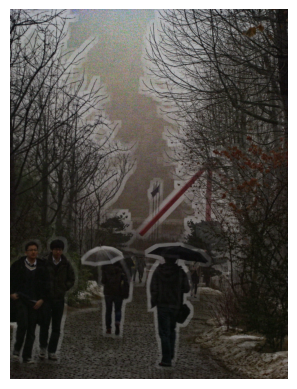

In [21]:
import cv2
import numpy as np

def estimate_dark_channel(image, patch_size=15):
    """Estimates the dark channel of an image."""
    min_channel = np.min(image, axis=2)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (patch_size, patch_size))
    dark_channel = cv2.erode(min_channel, kernel)
    return dark_channel

def estimate_atmospheric_light(image, dark_channel):
    """Estimates the atmospheric light."""
    height, width = dark_channel.shape
    num_pixels = height * width
    indices = dark_channel.reshape(num_pixels).argsort()[num_pixels - int(num_pixels * 0.001):]
    atmospheric_light = np.max(image.reshape(num_pixels, 3)[indices], axis=0)
    return atmospheric_light

def estimate_transmission_map(image, atmospheric_light, omega=0.95, patch_size=15):
    """Estimates the transmission map."""
    normalized_image = image / atmospheric_light
    dark_channel = estimate_dark_channel(normalized_image, patch_size)
    transmission_map = 1 - omega * dark_channel
    return transmission_map

def recover_scene_radiance(image, transmission_map, atmospheric_light, t0=0.1):
    """Recovers the scene radiance."""
    transmission_map = np.maximum(transmission_map, t0)
    dehazed_image = np.zeros_like(image, dtype=np.float64)
    for i in range(3):
        dehazed_image[:, :, i] = (image[:, :, i] - atmospheric_light[i]) / transmission_map + atmospheric_light[i]
    return np.clip(dehazed_image, 0, 255).astype(np.uint8)

def dehaze(image_path):
    """Dehazes an image using the Dark Channel Prior."""
    image = cv2.imread(image_path).astype(np.float64)
    atmospheric_light = estimate_atmospheric_light(image, estimate_dark_channel(image))
    transmission_map = estimate_transmission_map(image, atmospheric_light)
    dehazed_image = recover_scene_radiance(image, transmission_map, atmospheric_light)
    return dehazed_image

# Example usage:
image_path = "dataset/base/train/St_Wf_D_L__033.JPG"
dehazed_image = dehaze(image_path)
plt.imshow(cv2.cvtColor(dehazed_image, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()